In [1]:
import geopandas as gpd
import pandas as pd
import os
import numpy as np
# import contextily as ctx

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
from IPython.display import Image
from skimage.morphology import (
    binary_closing,
    binary_erosion,
    binary_dilation,
    remove_small_objects,
    remove_small_holes,
    disk
)
from shapely.geometry import box
import folium
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

import rasterio
from rasterio import Affine
from rasterio.crs import CRS
#import rasterio.transform
from rasterio.windows import from_bounds
from rasterio.warp import Resampling, reproject, transform
from datetime import datetime

In [2]:
aoi = gpd.read_file('./aoi_felipe.shp')

In [3]:
xmin, ymin, xmax, ymax = aoi.total_bounds
bbox = (xmin, ymin, xmax, ymax)
print(bbox)

(np.float64(-48.12540466616911), np.float64(-12.560919121222181), np.float64(-47.98844199705623), np.float64(-12.431402329694894))


In [4]:
tocantins_focos_shp = "./focos_aoi.shp"

focos_shp = gpd.read_file(tocantins_focos_shp)


focos_shp.head()

,DataHora,Satelite,Pais,Estado,Municipio,Bioma,DiaSemChuv,Precipitac,RiscoFogo,FRP,Latitude,Longitude,geometry
0,2025/08/28 16:20:00,NPP-375,Brasil,TOCANTINS,PARANÃ,Cerrado,54,0.0,1.0,7.2,-12.46039,-48.00192,POINT (-48.00192 -12.46039)
1,2025/08/28 16:41:00,NOAA-20,Brasil,TOCANTINS,PARANÃ,Cerrado,54,0.0,1.0,4.0,-12.45933,-47.99376,POINT (-47.99376 -12.45933)
2,2025/08/28 16:41:00,NOAA-20,Brasil,TOCANTINS,PARANÃ,Cerrado,54,0.0,1.0,3.8,-12.45784,-48.00542,POINT (-48.00542 -12.45784)
3,2025/08/28 16:41:00,NOAA-20,Brasil,TOCANTINS,PARANÃ,Cerrado,54,0.0,1.0,4.0,-12.46265,-47.99324,POINT (-47.99324 -12.46265)
4,2025/08/29 03:49:00,NOAA-20,Brasil,TOCANTINS,PARANÃ,Cerrado,55,0.0,1.0,0.4,-12.44935,-47.99866,POINT (-47.99866 -12.44935)


In [5]:
import pystac_client
pystac_client.__version__

'0.8.6'

In [6]:
servico  = "https://data.inpe.br/bdc/stac/v1/"
catalogo  = pystac_client.Client.open(servico)

In [7]:
tile_s2_bdc = "22LHM"
# 22LHM
# 22LHL
# 22LGM

collection = ["S2_L2A-1"]
date_range = "2025-08-24/2025-10-03"
filter = { 
    "eo:cloud_cover": {"lt": 10},
    "bdc:tiles": {"eq": tile_s2_bdc},  # Filtro pelo tile específico
} # Filtro para máxima cobertura de nuvens

In [8]:
# Realizando a busca com os filtros
item_search = catalogo.search(bbox=bbox,
    collections=[collection],
    query=filter, 
    datetime=date_range,  # Intervalo de datas
)

In [9]:
item_search.item_collection()

In [10]:
items = list(item_search.item_collection())
# bbox = (items[0].bbox[0], items[0].bbox[1], items[0].bbox[2], items[0].bbox[3])
# print (bbox)

# Ordenar os itens por data (crescente: menor para maior)
items = sorted(items, key=lambda x: x.datetime)

In [11]:
for i, item in enumerate(items):
    item_id = item.id  # ID do item para identificação

    date = item.properties.get('datetime', 'N/A')  # Data da aquisição
    
    cloud_cover = item.properties.get('eo:cloud_cover', 'N/A')  # Obtém a cobertura de nuvens
    
    tile_id = item.properties.get('tileId')

    link = item.assets['PVI'].href
    print(f"Imagem [{i}]: Tile: {tile_id} Data: {date}, Cobertura de nuvens: {cloud_cover:.1f}%")

Imagem [0]: Tile: 22LHM Data: 2025-08-24T13:32:41Z, Cobertura de nuvens: 0.0%
Imagem [1]: Tile: 22LHM Data: 2025-08-26T13:32:41Z, Cobertura de nuvens: 0.0%
Imagem [2]: Tile: 22LHM Data: 2025-08-29T13:31:49Z, Cobertura de nuvens: 0.0%
Imagem [3]: Tile: 22LHM Data: 2025-09-03T13:32:41Z, Cobertura de nuvens: 3.5%
Imagem [4]: Tile: 22LHM Data: 2025-09-03T13:32:41Z, Cobertura de nuvens: 0.0%
Imagem [5]: Tile: 22LHM Data: 2025-09-05T13:32:41Z, Cobertura de nuvens: 0.0%
Imagem [6]: Tile: 22LHM Data: 2025-09-08T13:31:49Z, Cobertura de nuvens: 0.3%
Imagem [7]: Tile: 22LHM Data: 2025-09-13T13:32:01Z, Cobertura de nuvens: 0.0%
Imagem [8]: Tile: 22LHM Data: 2025-09-15T13:32:41Z, Cobertura de nuvens: 0.0%
Imagem [9]: Tile: 22LHM Data: 2025-09-28T13:31:49Z, Cobertura de nuvens: 0.0%
Imagem [10]: Tile: 22LHM Data: 2025-10-03T13:32:01Z, Cobertura de nuvens: 0.0%


In [12]:
imagem_pre = items[0].assets
imagem_pos = items[-1].assets

In [13]:
def transforme_20m (asset, transforme, crs):
    '''Reamostragem de dados de 20 para 10 mts'''

    tranform_20 = Affine(20.0, 0.0, transforme.c,
                         transforme.d,-20.0,transforme.f)

    # Cria uma matriz numpy (grade regular) para o resultado reamostrado, com as dimensões (shape) e o tipo corretos
    array_20 = np.zeros((int(asset.shape[0]/2), int(asset.shape[1]/2)), dtype=asset.dtype)

    reproject(
        source=asset.data, # Passa apenas os valores e não o masked array
        destination=array_20,
        src_transform=transforme,
        src_crs=crs,
        dst_transform=tranform_20,
        dst_crs=crs,
        src_nodata=0, # Assume 0 como nodata para os dados de entrada
        dst_nodata=0, # Assume 0 como nodata para os dados de saída
        resampling=Resampling.nearest
    )
    return array_20

In [14]:
def read(uri: str, bbox: list, masked: bool = True, crs: str = None):
    """Read raster window as numpy.ma.masked_array."""
    source_crs = CRS.from_string('EPSG:4326')
    
    if crs:
        source_crs = CRS.from_string(crs)

    # Expects the bounding box has 4 values
    w, s, e, n = bbox
        
    with rasterio.open(uri) as dataset:
        transformer = transform(source_crs, dataset.crs, [w, e], [s, n])
        window = from_bounds(transformer[0][0], transformer[1][0], 
                             transformer[0][1], transformer[1][1], dataset.transform)
        
        box_trasform = rasterio.transform.from_bounds(transformer[0][0], transformer[1][0],
                                                      transformer[0][1], transformer[1][1], window.width, window.height)
        
        return dataset.read(1, window=window, masked=masked)*0.0001, box_trasform

In [15]:
ds = rasterio.open(imagem_pre['B04'].href)
ds.crs

CRS.from_wkt('PROJCS["WGS 84 / UTM zone 22S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-51],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32722"]]')

In [16]:
# Retorna um dicionário com as bandas e o rgb (B12, B08, B04)
def processar_imagem(imagem, bbox, ds_crs):

    bandas = {}

    for banda in ['B04', 'B08']:
        arr, transf = read(imagem[banda].href, bbox=bbox)
        bandas[banda] = transforme_20m(arr, transf, ds_crs)

    for banda in ['B8A', 'B11', 'B12']:
        arr, _ = read(imagem[banda].href, bbox=bbox)
        bandas[banda] = arr

    min_rows = min(b.shape[0] for b in bandas.values())
    min_cols = min(b.shape[1] for b in bandas.values())

    for key in bandas:
        bandas[key] = bandas[key][:min_rows, :min_cols]

    rgb = np.dstack([
        bandas['B12'],
        bandas['B08'],
        bandas['B04']
    ])

    return bandas, rgb


In [17]:
bandas_pre, rgb_pre = processar_imagem(imagem_pre, bbox, ds.crs)
bandas_pos, rgb_pos = processar_imagem(imagem_pos, bbox, ds.crs)
_, box_trasform_20m = read(imagem_pre['SCL'].href, bbox=aoi.total_bounds)

In [18]:
# Formata as datas da imagem para o plot
data_inicio_str = items[0].properties.get("datetime")
data_inicio_obj = datetime.strptime(data_inicio_str, "%Y-%m-%dT%H:%M:%SZ")
data_inicio_format = data_inicio_obj.strftime("%d/%m/%Y")

data_fim_str = items[-1].properties.get("datetime")
data_fim_obj = datetime.strptime(data_fim_str, "%Y-%m-%dT%H:%M:%SZ")
data_fim_format = data_fim_obj.strftime("%d/%m/%Y")

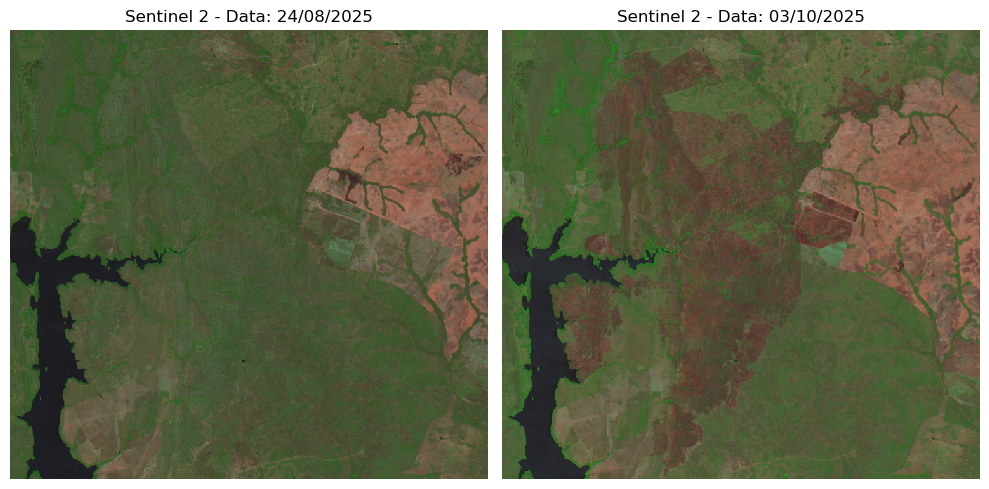

In [19]:
# Cria a figura e dois subplots lado a lado (1 linha, 2 colunas)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Primeira imagem: Pré-fogo
axes[0].set_title(f"Sentinel 2 - Data: {data_inicio_format}")
axes[0].axis('off')
axes[0].imshow((rgb_pre*255).astype(np.uint8), interpolation='nearest')

# Segunda imagem: Pós-fogo
axes[1].set_title(f"Sentinel 2 - Data: {data_fim_format}")
axes[1].axis('off')
axes[1].imshow((rgb_pos*255).astype(np.uint8), interpolation='nearest')

# Ajusta o layout para evitar sobreposição
plt.tight_layout()
plt.show()

In [20]:
# Verifica as dimensões
height, width, num_bands = rgb_pre.shape

with rasterio.open(
    './output/rgb_image_pre.tif',   # nome do arquivo de saída
    'w',
    driver='GTiff',
    height=height,
    width=width,
    count=num_bands,            # 3 bandas RGB
    dtype=rgb_pre.dtype,
    crs=ds.crs,                    # sistema de referência (ex.: "EPSG:4326")
    transform=box_trasform_20m         # transform (georreferenciamento)
) as dst:
    for i in range(num_bands):
        dst.write(rgb_pre[:, :, i], i + 1)

print("RGB Pré-Fogo salvo como './output/rgb_image_pre.tif'.")

# Verifica as dimensões
height, width, num_bands = rgb_pos.shape

with rasterio.open(
    './output/rgb_image_pos.tif',   # nome do arquivo de saída
    'w',
    driver='GTiff',
    height=height,
    width=width,
    count=num_bands,            # 3 bandas RGB
    dtype=rgb_pos.dtype,
    crs=ds.crs,                    # sistema de referência (ex.: "EPSG:4326")
    transform=box_trasform_20m         # transform (georreferenciamento)
) as dst:
    for i in range(num_bands):
        dst.write(rgb_pos[:, :, i], i + 1)

print("RGB Pós-Fogo salvo como './output/rgb_image_pos.tif'.")
    

RGB Pré-Fogo salvo como './output/rgb_image_pre.tif'.
RGB Pós-Fogo salvo como './output/rgb_image_pos.tif'.


In [21]:
# Geração do Índice NDVI - Exemplo com bandas específicas do Sentinel
# NDVI = (B08 - B04) / (B08 + B04)
def ndvi(b08,b04):
    ndvi=(b08-b04)/(b08+b04)
    return ndvi

# Geração do Índice NBR
# NBR = (B08 - B12) / (B08 + B12)
def nbr(b8A,b12):
    nbr=(b8A-b12)/(b8A+b12)
    return nbr

# Geração do Índice NBRSWIR (Normalized Burn Ratio-SWIR)
# NBRSWIR = (B12 − B11 − 0.02)/( B12 + B11 + 0.1)
def nbrswir(b12,b11):
    nbrswir = (b12 - b11 - 0.02)/(b12 + b11 + 0.1)
    return nbrswir

In [22]:
# calculo dos indices pré fogo
ndvi_pre = ndvi(bandas_pre["B08"],bandas_pre["B04"])
nbr_pre = nbr(bandas_pre["B8A"],bandas_pre["B12"])
nbrswir_pre = nbrswir(bandas_pre["B11"],bandas_pre["B12"])

    
# calculo dos indices pós fogo
ndvi_pos = ndvi(bandas_pos["B08"],bandas_pos["B04"])
nbr_pos = nbr(bandas_pos["B8A"],bandas_pos["B12"])
nbrswir_pos = nbrswir(bandas_pos["B11"],bandas_pos["B12"])

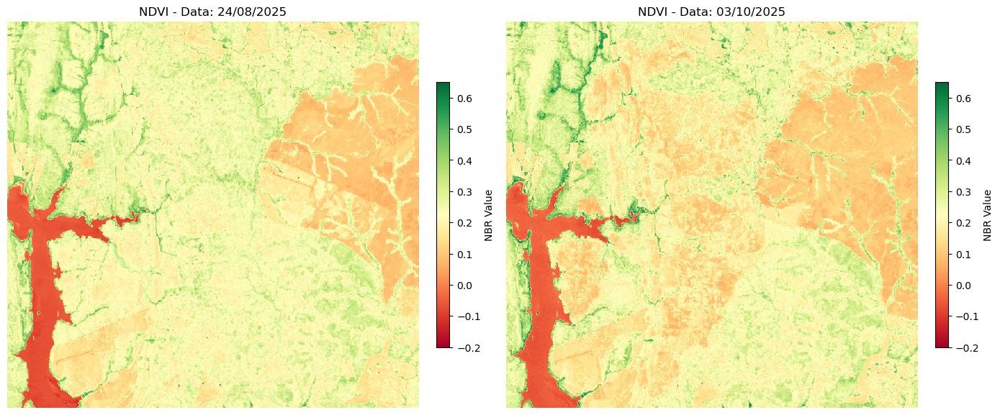

In [23]:
# Configura a figura com dois subplots (1 linha, 2 colunas)
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plota imagem NBR pré-fogo
ndvi_pre_plot = axes[0].imshow(ndvi_pre, cmap="RdYlGn", vmin=-0.2, vmax=0.65, interpolation='nearest')
axes[0].set_title(f"NDVI - Data: {data_inicio_format}")
axes[0].axis("off")
cbar_pre = plt.colorbar(ndvi_pre_plot, ax=axes[0], fraction=0.03, pad=0.04)
cbar_pre.set_label("NBR Value")

# Plota imagem NBR pós-fogo
ndvi_pos_plot = axes[1].imshow(ndvi_pos, cmap="RdYlGn", vmin=-0.2, vmax=0.65, interpolation='nearest')
axes[1].set_title(f"NDVI - Data: {data_fim_format}")
axes[1].axis("off")
cbar_pos = plt.colorbar(ndvi_pos_plot, ax=axes[1], fraction=0.03, pad=0.04)
cbar_pos.set_label("NBR Value")

# Ajusta o layout para evitar sobreposição
plt.tight_layout()
plt.show()

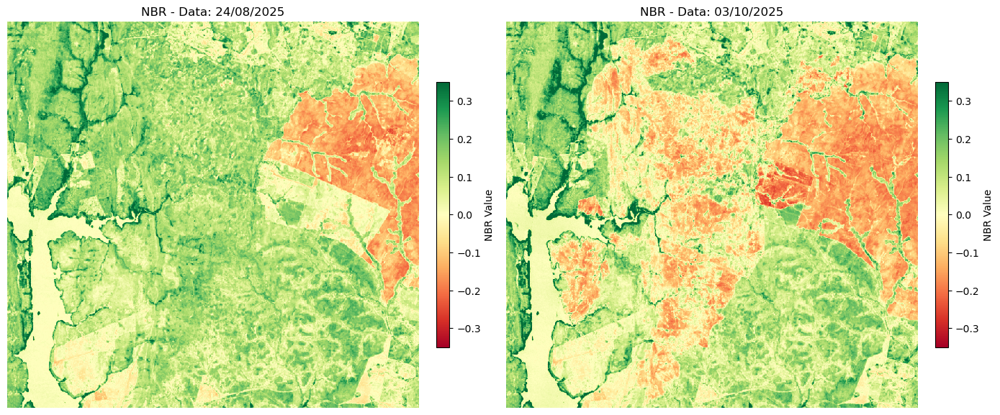

In [24]:
# Configura a figura com dois subplots (1 linha, 2 colunas)
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plota imagem NBR pré-fogo
nbr_pre_plot = axes[0].imshow(nbr_pre, cmap="RdYlGn", vmin=-0.35, vmax=0.35, interpolation='nearest')
axes[0].set_title(f"NBR - Data: {data_inicio_format}")
axes[0].axis("off")
cbar_pre = plt.colorbar(nbr_pre_plot, ax=axes[0], fraction=0.03, pad=0.04)
cbar_pre.set_label("NBR Value")

# Plota imagem NBR pós-fogo
nbr_pos_plot = axes[1].imshow(nbr_pos, cmap="RdYlGn", vmin=-0.35, vmax=0.35, interpolation='nearest')
axes[1].set_title(f"NBR - Data: {data_fim_format}")
axes[1].axis("off")
cbar_pos = plt.colorbar(nbr_pos_plot, ax=axes[1], fraction=0.03, pad=0.04)
cbar_pos.set_label("NBR Value")

# Ajusta o layout para evitar sobreposição
plt.tight_layout()
plt.show()

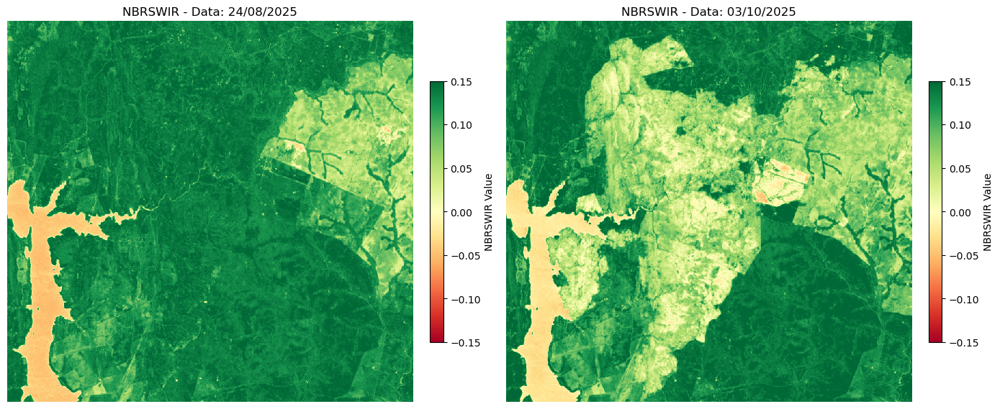

In [25]:
# Configura a figura com dois subplots (1 linha, 2 colunas)
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plota imagem NBRSWIR pré-fogo
nbrswir_pre_plot = axes[0].imshow(nbrswir_pre, cmap="RdYlGn", vmin=-0.15, vmax=0.15, interpolation='nearest')
axes[0].set_title(f"NBRSWIR - Data: {data_inicio_format}")
axes[0].axis("off")
cbar_pre = plt.colorbar(nbrswir_pre_plot, ax=axes[0], fraction=0.03, pad=0.04)
cbar_pre.set_label("NBRSWIR Value")

# Plota imagem NBRSWIR pós-fogo
nbrswir_pos_plot = axes[1].imshow(nbrswir_pos, cmap="RdYlGn", vmin=-0.15, vmax=0.15, interpolation='nearest')
axes[1].set_title(f"NBRSWIR - Data: {data_fim_format}")
axes[1].axis("off")
cbar_pos = plt.colorbar(nbrswir_pos_plot, ax=axes[1], fraction=0.03, pad=0.04)
cbar_pos.set_label("NBRSWIR Value")

# Ajusta o layout para evitar sobreposição
plt.tight_layout()
plt.show()

In [26]:
# cálculo da diferença relativa dos índices espectrais
ndvi_dif = ndvi_pre - ndvi_pos

nbr_dif = nbr_pre - nbr_pos

nbrswir_dif = nbrswir_pre - nbrswir_pos

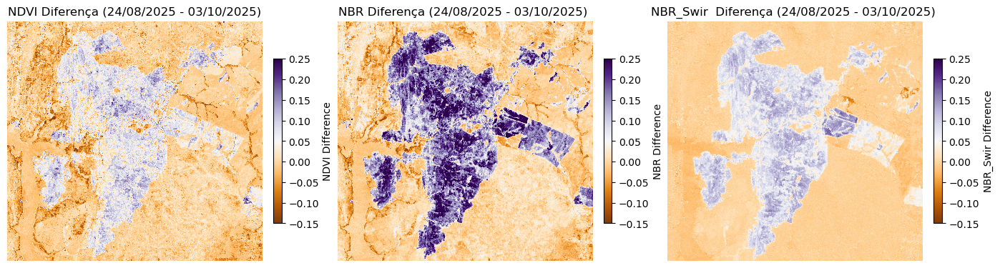

In [27]:
# Configura a figura com dois subplots (1 linha, 3 colunas)
fig, axes = plt.subplots(1, 3, figsize=(14, 7))

# Plot diferença NDVI
ndvi_dif_plot = axes[0].imshow(ndvi_dif, cmap="PuOr", vmin=-0.15, vmax=0.25, interpolation='nearest')
axes[0].set_title(f"NDVI Diferença ({data_inicio_format} - {data_fim_format})")
axes[0].axis("off")
cbar_ndvi = plt.colorbar(ndvi_dif_plot, ax=axes[0], fraction=0.03, pad=0.04)
cbar_ndvi.set_label("NDVI Difference")

# Plot diferença NBR
nbr_dif_plot = axes[1].imshow(nbr_dif, cmap="PuOr", vmin=-0.15, vmax=0.25, interpolation='nearest')
axes[1].set_title(f"NBR Diferença ({data_inicio_format} - {data_fim_format}) ")
axes[1].axis("off")
cbar_nbr = plt.colorbar(nbr_dif_plot, ax=axes[1], fraction=0.03, pad=0.04)
cbar_nbr.set_label("NBR Difference")

# Plot diferença NBR
nbrswir_dif_plot = axes[2].imshow(nbrswir_dif, cmap="PuOr", vmin=-0.15, vmax=0.25, interpolation='nearest')
axes[2].set_title(f"NBR_Swir  Diferença ({data_inicio_format} - {data_fim_format}) ")
axes[2].axis("off")
cbar_nbr = plt.colorbar(nbrswir_dif_plot, ax=axes[2], fraction=0.03, pad=0.04)
cbar_nbr.set_label("NBR_Swir Difference")

# Ajusta o layout para evitar sobreposição
plt.tight_layout()
plt.show()

In [28]:
height, width = ndvi_dif.shape

indices = {'ndvi': ndvi_dif, 'nbr': nbr_dif, 'nbrswir': nbrswir_dif}

for nome_indice, matriz in indices.items():
    nome_output = f"./output/{nome_indice}.tif"
    
    with rasterio.open(
        nome_output,
        'w',
        driver='GTiff',
        height=height,
        width=width,
        count=1,
        dtype=matriz.dtype,
        crs=ds.crs,
        transform=box_trasform_20m,
    ) as dst:
        dst.write(matriz, 1)
    
    print(f"{nome_indice} Diferença salva como '{nome_output}_dif'.")

ndvi Diferença salva como './output/ndvi.tif_dif'.
nbr Diferença salva como './output/nbr.tif_dif'.
nbrswir Diferença salva como './output/nbrswir.tif_dif'.


In [29]:
# Utiliza o método where do numpy para criar uma máscara de 0 e 1
threshold = {
    'nbr': 0.1244,
    'ndvi': 0.0453,
    'nbrswir': 0.06   
}
# Extraidos a partir da média entre a mediana e o primeiro quartil dos valores obtidos a partir dos focos na região (analise exploratoria)

threshold_resultados = {}

print ("Indices e thresholds utilizados")
for nome_indice, matriz in indices.items():
    thres_0_1 = np.where(matriz >= threshold[nome_indice], 1, 0)
    print(nome_indice , threshold[nome_indice])
    threshold_resultados[nome_indice] = thres_0_1

Indices e thresholds utilizados
ndvi 0.0453
nbr 0.1244
nbrswir 0.06


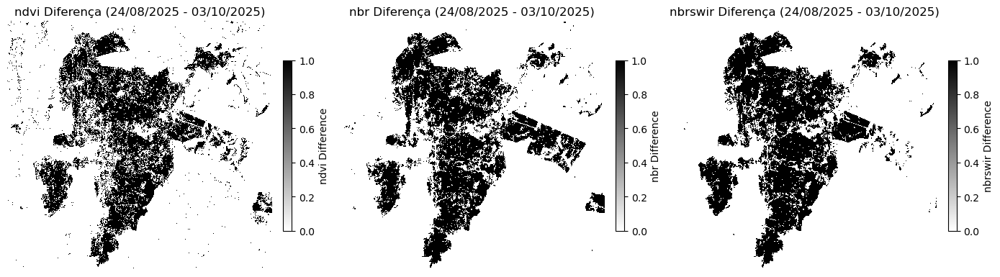

In [30]:
# Configura a figura com dois subplots (1 linha, 3 colunas)
fig, axes = plt.subplots(1, 3, figsize=(14, 7))

# Loop com os índices para gerar os subplots
for i, (nome_indice, valor) in enumerate(threshold_resultados.items()):
    plot = axes[i].imshow(valor, cmap="gray_r", interpolation='nearest')
    axes[i].set_title(f"{nome_indice} Diferença ({data_inicio_format} - {data_fim_format})")
    axes[i].axis("off")
    axes[i].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    cbar = plt.colorbar(plot, ax=axes[i], fraction=0.03, pad=0.04)
    cbar.set_label(f"{nome_indice} Difference")

plt.tight_layout()
plt.show()

In [31]:
from rasterio.features import shapes
from shapely.geometry import shape


for i, (nome_indice, valor) in enumerate(threshold_resultados.items()):

    # Converte a máscara para int (0 and 1)
    mask_burn = valor.astype(np.uint8)
    
    # Converte para poligos
    results = shapes(mask_burn, mask=mask_burn == 1, transform=box_trasform_20m)
    
    # Convert para um objeto de geometria da biblioteca shapely
    geoms = [shape(geom) for geom, val in results if val == 1]
    
    gdf = gpd.GeoDataFrame(geometry=geoms, crs=ds.crs)
    
    gdf["queimada"] = 1
    
    # Save to GeoPackage or Shapefile em UTM
    gdf.to_file(f"./output/{nome_indice}_area_queimada_aoi.shp", driver= "ESRI Shapefile")
    
    # Transforma para EPSG:4326
    gdf = gdf.to_crs("EPSG:4326")
        
    # Save to GeoPackage or Shapefile em UTM
    gdf.to_file(f"./output/{nome_indice}_area_queimada_aoi_wgs84.shp", driver= "ESRI Shapefile")
    print(f" Salvo em ./output/{nome_indice}_area_queimada_aoi_wgs84.shp")

 Salvo em ./output/ndvi_area_queimada_aoi_wgs84.shp
 Salvo em ./output/nbr_area_queimada_aoi_wgs84.shp
 Salvo em ./output/nbrswir_area_queimada_aoi_wgs84.shp


In [32]:
# Step 1: Read the file
gdf = gpd.read_file("./focos_aoi.shp")

df = gdf[['Longitude', 'Latitude', 'DataHora']].dropna().copy()

df['DataHora'] = pd.to_datetime(df['DataHora'])
df['days'] = (df['DataHora'] - df['DataHora'].min()).dt.days


min_day = df['days'].min()
max_day = df['days'].max()

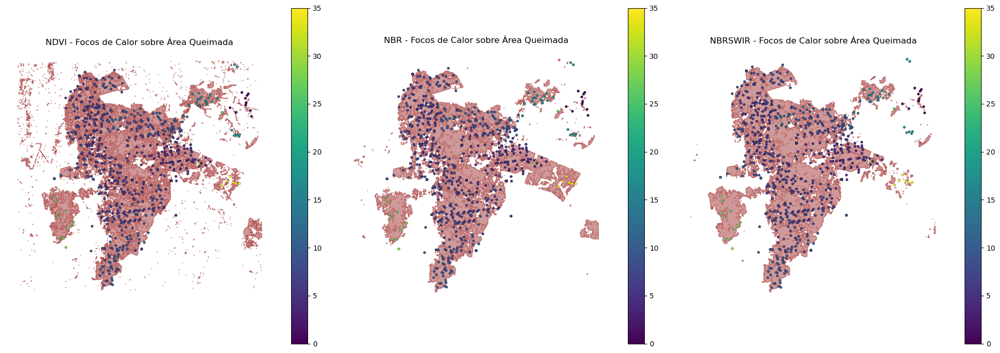

In [33]:
# Criar GeoDataFrame dos pontos
gdf_points = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']),
    crs='EPSG:4326'
)

# Configura a figura com dois subplots (1 linha, 3 colunas)
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

for i, (nome_indice, mask) in enumerate(threshold_resultados.items()):
    ax = axes[i]

    # Ler shapefile da área queimada correspondente
    area_queimada = gpd.read_file(f"./output/{nome_indice}_area_queimada_aoi.shp")
    
    # Reprojetar para Web Mercator
    area_queimada = area_queimada.to_crs(epsg=3857)
    gdf_points_merc = gdf_points.to_crs(epsg=3857)
    
    # Plotar área queimada
    area_queimada.plot(
        ax=ax,
        color='darkred',
        alpha=0.4,
        edgecolor='darkred'
    )
    
    # Plot dos pontos
    gdf_points_merc.plot(
        ax=ax,
        column='days',
        cmap='viridis',
        markersize=12,
        edgecolor='black',
        linewidth=0.2,
        legend=True
    )
    
    ax.set_title(f'{nome_indice.upper()} - Focos de Calor sobre Área Queimada', fontsize=12)
    ax.set_axis_off()

plt.tight_layout()
plt.show()